# **TensorFlow Object Detection**

# **Fish Snap** **(C241-PS013)**

<p>
Fish Snap uses computer vision, which is object detection with CNN. We use tensorflow to perform object detection in classifying marine fish species. We also use TensorFlow 2 Object Detection and SSD MobileNet V2.
<br>We use 10 classes of marine fish to be used as datasets. The dataset was collected by photographing the fish in the fish market and obtaining and selecting images on the internet.
</p>

<p>
The 10 fish classes are:

|  |  |
|---------|---------|
| Ikan_Bawal_Hitam | Ikan_Salem |
| Ikan_Cipa_Cipa | Ikan_Sebelah |
| Ikan_Kembung | Ikan_Selar_Bulat |
| Ikan_Kenyar | Ikan_Tenggiri_Papan |
| Ikan_Kuwe | Ikan_Tuna |
</p>






# 1.&nbsp;Collecting and labeling data with Roboflow


![Screenshot-2024-05-29-074619.png](https://i.postimg.cc/4d6nVLyN/Screenshot-2024-05-29-074619.png)

Upload all datasets to roboflow in image form. After that annotate the images and label each image according to the right class.





#2.&nbsp;Install TensorFlow Object Detection Dependencies

In this case we use <code>TensorFlow 2.8</code> to avoid bugs and failures in the current version of colab.



In [1]:
# Clone the tensorflow models repository from GitHub
!pip uninstall Cython -y # Fix for "No module named 'object_detection'" error
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.10
Uninstalling Cython-3.0.10:
  Successfully uninstalled Cython-3.0.10
Cloning into 'models'...
remote: Enumerating objects: 4094, done.
remote: Counting objects: 100% (4094/4094), done.
remote: Compressing objects: 100% (3096/3096), done.
remote: Total 4094 (delta 1186), reused 2015 (delta 937), pack-reused 0
Receiving objects: 100% (4094/4094), 44.64 MiB | 29.24 MiB/s, done.
Resolving deltas: 100% (1186/1186), done.


In [2]:
# Copy setup files into models/research folder
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [3]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [1]:
# Install the Object Detection API

!pip install pyyaml==5.3
!pip install /content/models/research/

# Install TensorFlow 2.8.0
!pip install tensorflow==2.8.0

# Install CUDA version 11.0 (to maintain compatibility with TF v2.8.0)
!pip install tensorflow_io==0.23.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH

Processing ./models/research
  Preparing metadata (setup.py) ... done
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697352 sha256=afb47dae2993517daa2d37314e00a3b7fe8dc722a46a7d1219c0e75767272f13
  Stored in directory: /tmp/pip-ephem-wheel-cache-zekx3dy9/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1
--2024-05-29 23:47:04--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.195.19.142
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.195.19.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 190 [application/octet-stream]
Saving

In [2]:
# Run Model Bulider Test file, just to verify everything's working properly
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2024-05-29 23:51:12.713838: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0529 23:51:13.563448 132267027972736 model_builder.py:1112] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 5.07s
I0529 23:51:14.263615 132267027972736 test_util.py:2373] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 5.07s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 1.24s
I0529 23:51:15.503665 132267027972736 tes

# 3.&nbsp;Upload Image Dataset and Prepare Training Data

Next, create a folder for the dataset and import the dataset from the roboflow that we have created.

In [3]:
%cd /content
%mkdir dataset
%cd dataset

/content
/content/dataset


In [4]:
# Install roboflow
!pip install roboflow -q

# Import dataset from roboflow with format: tensorflow tfrecord
from roboflow import Roboflow
rf = Roboflow(api_key="Y8wjXJqieRjo9ozZYBOw")
project = rf.workspace("bangkit-360xb").project("detection-fish-6asg4")
version = project.version(14)
dataset = version.download("tfrecord")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.8.0 requires pyyaml<6.0,>=5.1, but you have pyyaml 6.0.1 which is incompatible.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Detection-Fish-14 in tfrecord:: 100%|██████████| 11/11 [00:01<00:00,  5.71it/s]


In [5]:
### This creates a "labelmap.txt" file with a list of classes the object detection model will detect.
%%bash
cat <<EOF >> /content/labelmap.txt
Ikan_Bawal_Hitam
Ikan_Cipa_Cipa
Ikan_Kembung
Ikan_Kenyar
Ikan_Kuwe
Ikan_Salem
Ikan_Sebelah
Ikan_Selar_Bulat
Ikan_Tenggiri_Papan
Ikan_Tuna
EOF

Store the locations of the TFRecord and labelmap files as variables so we can reference them later in this Colab session.

In [6]:
train_record_fname = '/content/dataset/Detection-Fish-14/train/Fish.tfrecord'
val_record_fname = '/content/dataset/Detection-Fish-14/valid/Fish.tfrecord'
label_map_pbtxt_fname = '/content/dataset/Detection-Fish-14/train/Fish_label_map.pbtxt'

# 4.&nbsp;Set Up Training Configuration

In this section, set up the training model and configuration. We use a pre-trained TensorFlow model, which is SSD Mobilenet V2 in the TensorFlow 2 Object Detection Model Zoo repository.

In [7]:
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    'ssd_mobilenet_v2_fpnlite_640': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz',
    },
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

Download the pretrained model file and configuration file.

In [8]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2024-05-29 23:55:11--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.141.207, 142.251.2.207, 2607:f8b0:4023:c0b::cf, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.141.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  41.5MB/s    in 0.5s    

2024-05-29 23:55:11 (41.5 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2024-05-29 23:55:12--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.1

In [9]:
# Set training parameters for the model
num_steps = 25000
batch_size = 16

In [10]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 10


Then, rewrite the config file to use the predefined training parameters. The following code section will automatically replace the necessary parameters in the downloaded .config file and save it as a “pipeline_file.config” file.

In [11]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # Reduce learning rate for ssd-mobilenet-v2
    s = re.sub('learning_rate_base: .8',
                'learning_rate_base: .08', s)

    s = re.sub('warmup_learning_rate: 0.13333',
                'warmup_learning_rate: .026666', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [12]:
# Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 10
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator 

Set the locations of the configuration file and model output directory as variables.

In [13]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# 5.&nbsp;Train Custom TFLite Detection Model

In [14]:
# Training model
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.13.0 and strictly below 2.16.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.8.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're us

In [21]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

# 6.&nbsp;Convert Model


### 6.1&nbsp;Convert Model to TensorFlow Lite

In [15]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


2024-05-30 02:10:45.754422: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0530 02:10:49.653008 132337363068032 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0530 02:10:56.122053 132337363068032 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2024-05-30 02:10:57.952573: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
I0530 02:10:58.649828 132337363068032 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
W0530 02:10:59.998419 132337363068032 save_impl.py:71] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x785bbdfec3d0>, because it is not built.
W0530 02:11:00.252830

In [16]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

### 6.2&nbsp;Convert Model to .h5 (HDF5)

In [17]:
import tensorflow as tf
from tensorflow import keras
import os

# Create a directory to store the trained HDF5 models
output_directory = '/content/custom_model_h5'
os.makedirs(output_directory, exist_ok=True)

# Path to directory training
last_model_path = '/content/training'

# Export the trained graph file to SavedModel format
!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

# Load the SavedModel
saved_model_dir = os.path.join(output_directory, 'saved_model')
loaded_model = tf.saved_model.load(saved_model_dir)

# Since the loaded model is not a Keras model, we need to create a new Keras model and transfer the weights
# You need to define your model architecture here similar to the one in the saved model

# Example architecture (this needs to match your actual model architecture)
model = keras.Sequential([
    keras.layers.Input(shape=(None, None, 3)),  # Input layer with the same shape as your training data
    # Add layers to match your model's architecture
])

# Load weights manually (if possible)
# Note: This is a placeholder; actual implementation depends on the model details
# You may need to load weights layer by layer or use a custom loading function

# Example: Assuming the model has a similar architecture and can load weights directly
# You may need to adjust this part based on your actual model and layers
for layer in model.layers:
    if layer.name in loaded_model.signatures['serving_default']:
        layer.set_weights(loaded_model.signatures['serving_default'][layer.name].weights)

# Save the Keras model to HDF5 format
model.save(os.path.join(output_directory, 'detect.h5'))


2024-05-30 02:11:48.443665: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0530 02:11:52.445032 132558616126592 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
I0530 02:11:57.571920 132558616126592 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
2024-05-30 02:11:59.586304: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
I0530 02:12:00.520209 132558616126592 api.py:441] feature_map_spatial_dims: [(40, 40), (20, 20), (10, 10), (5, 5), (3, 3)]
W0530 02:12:02.472110 132558616126592 save_impl.py:71] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x788f3926c520>, because it is not built.
W0530 02:12:02.812910

# 7.&nbsp;Test Model

### 7.1&nbsp;Test TensorFlow Lite Model

Detected object: Ikan_Bawal_Hitam, Confidence: 99%


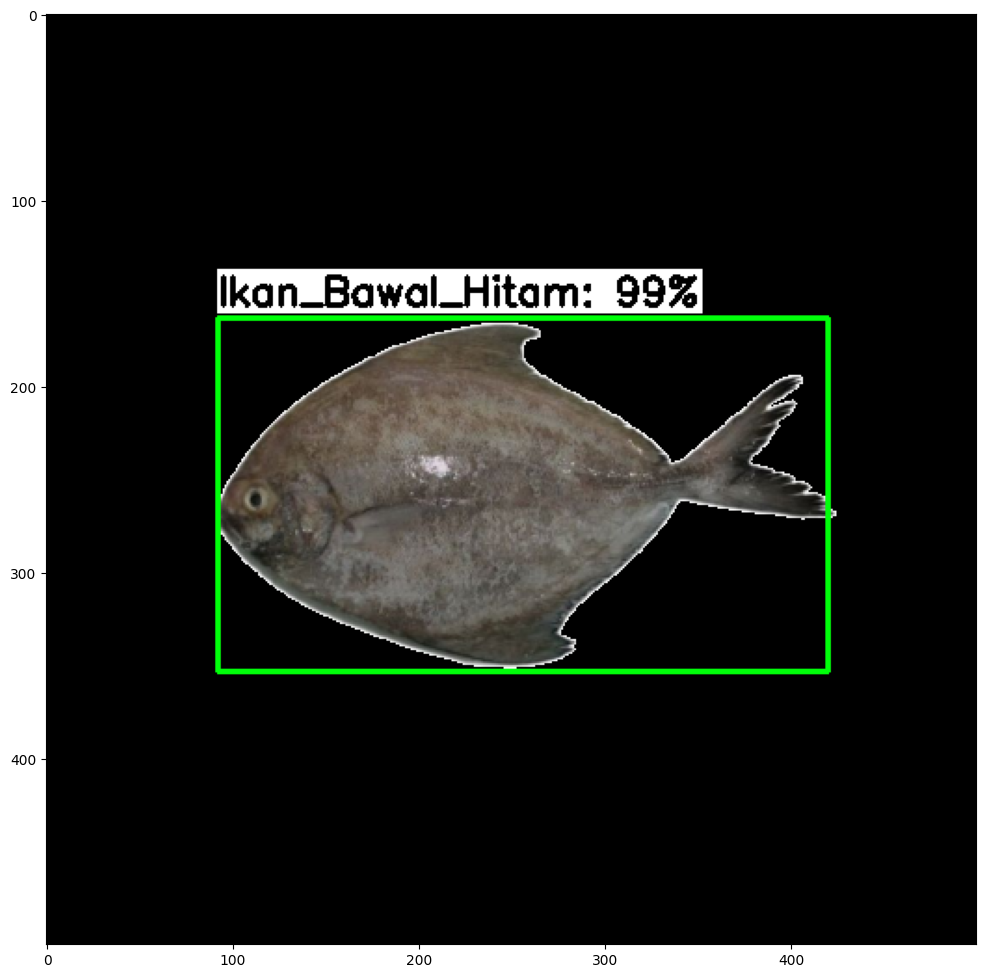

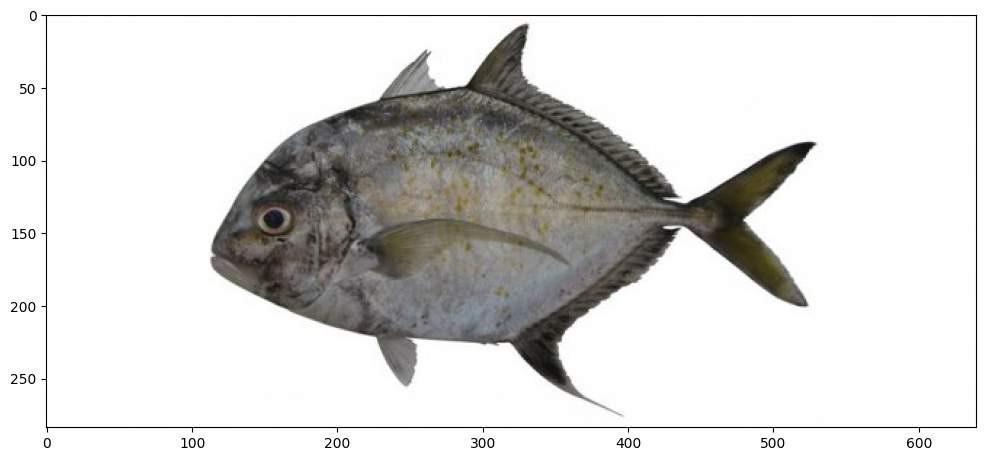

Detected object: Ikan_Cipa_Cipa, Confidence: 97%


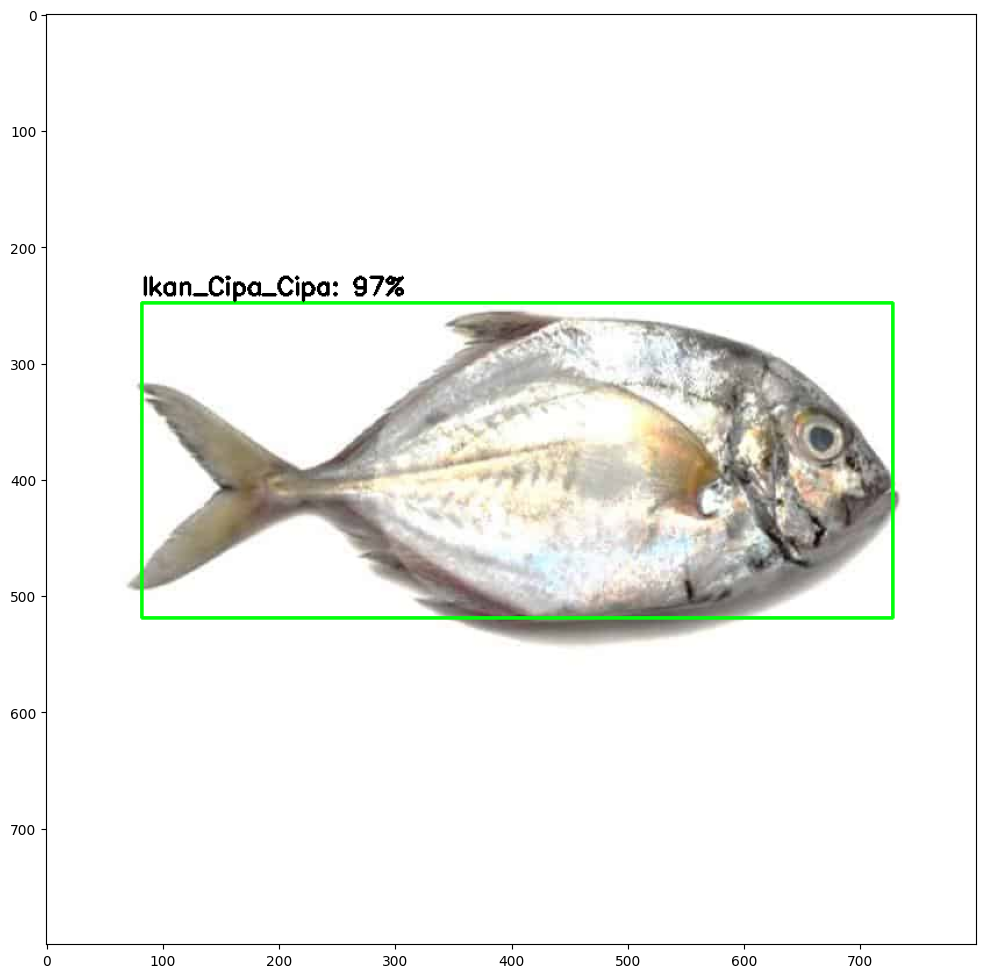

Detected object: Ikan_Kembung, Confidence: 85%
Detected object: Ikan_Kembung, Confidence: 81%


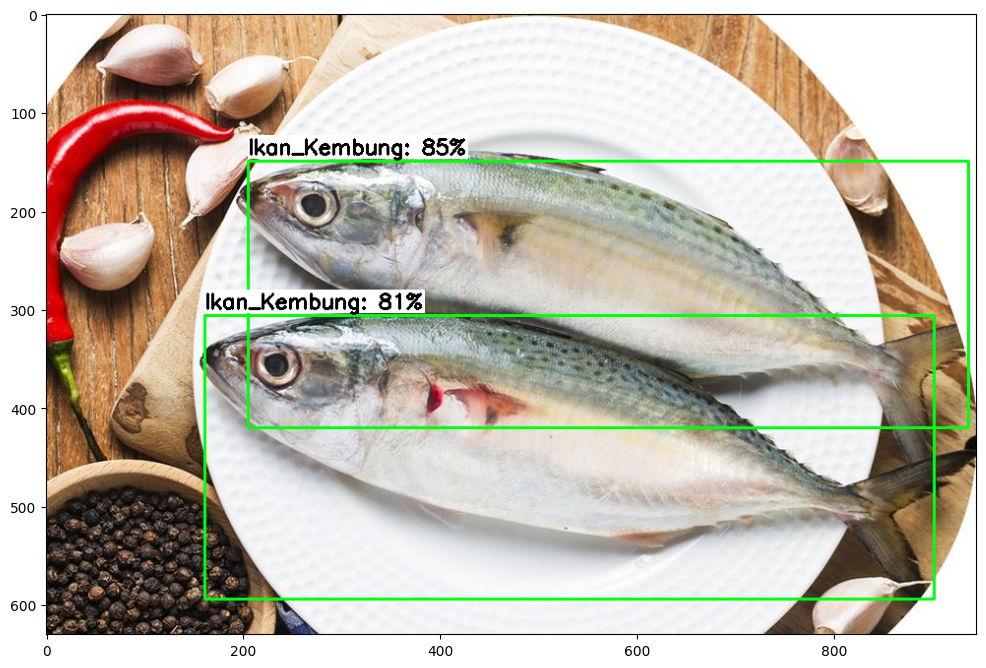

Detected object: Ikan_Cipa_Cipa, Confidence: 98%


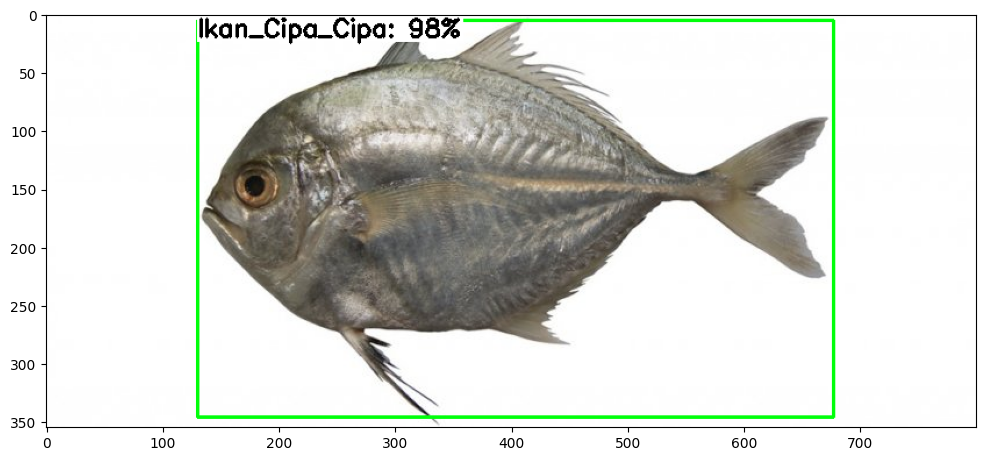

Detected object: Ikan_Bawal_Hitam, Confidence: 99%


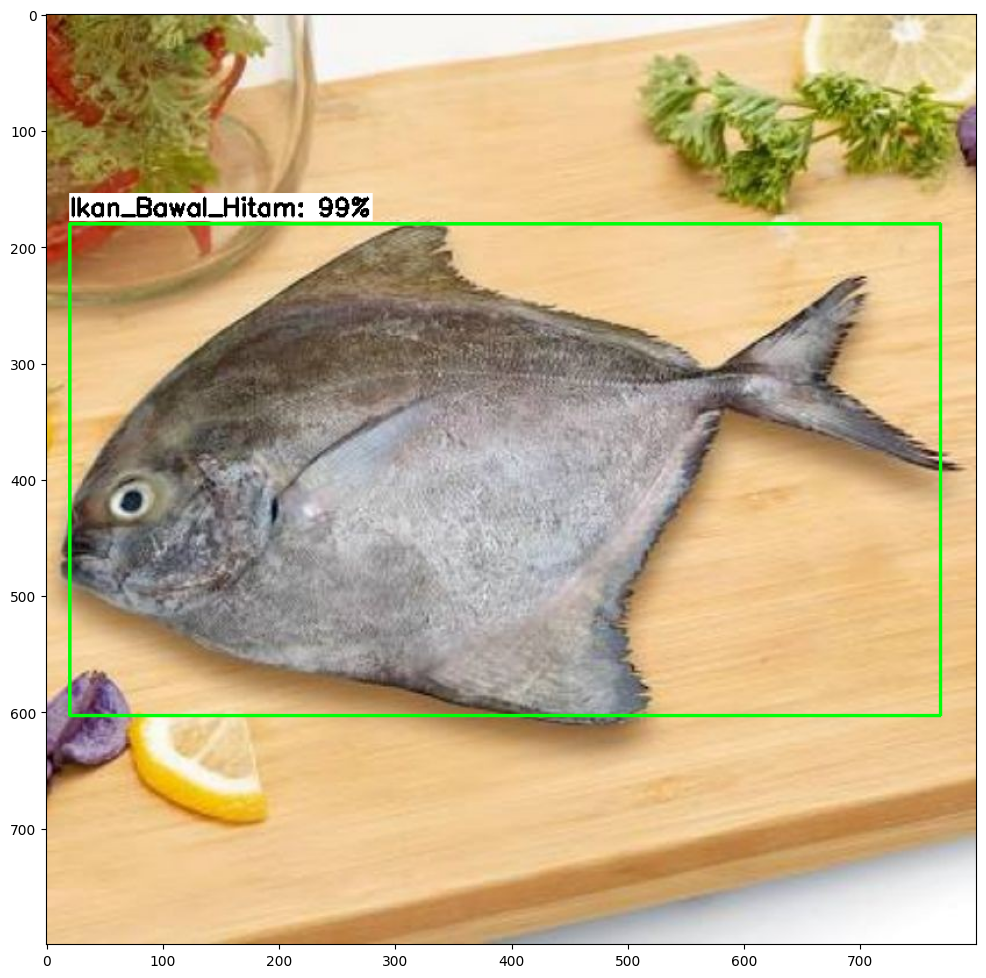

Detected object: Ikan_Tuna, Confidence: 83%


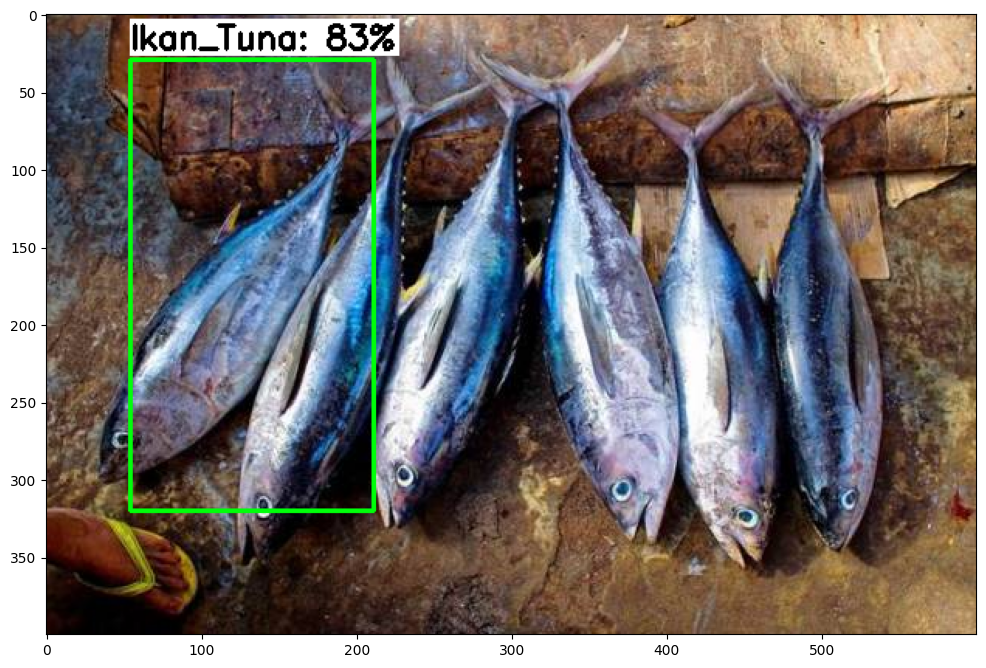

Detected object: Ikan_Kembung, Confidence: 97%
Detected object: Ikan_Kembung, Confidence: 97%


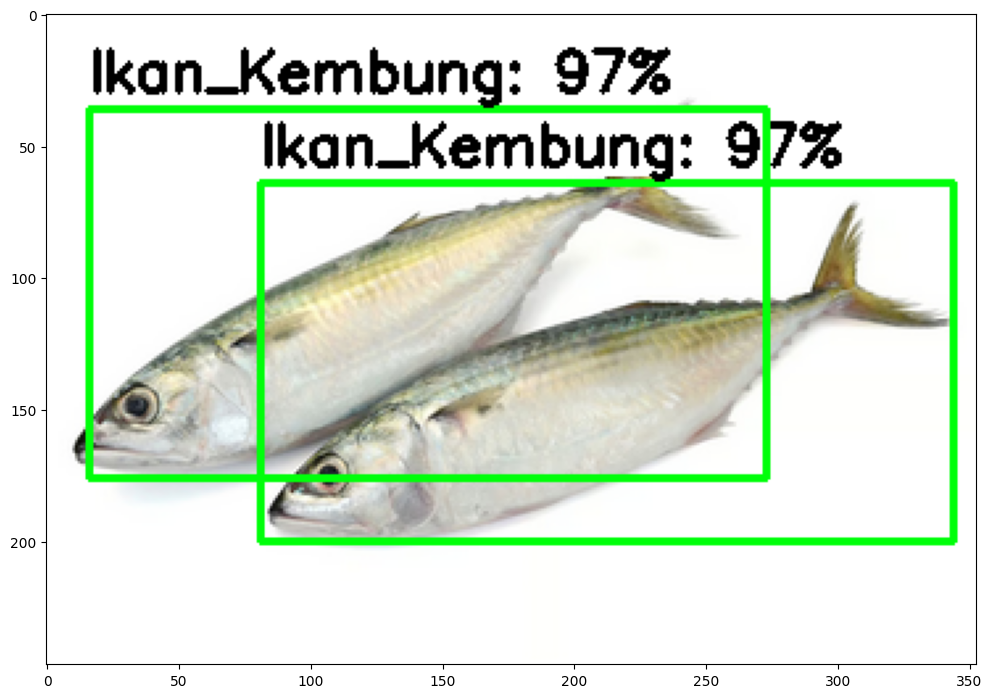

Detected object: Ikan_Cipa_Cipa, Confidence: 80%


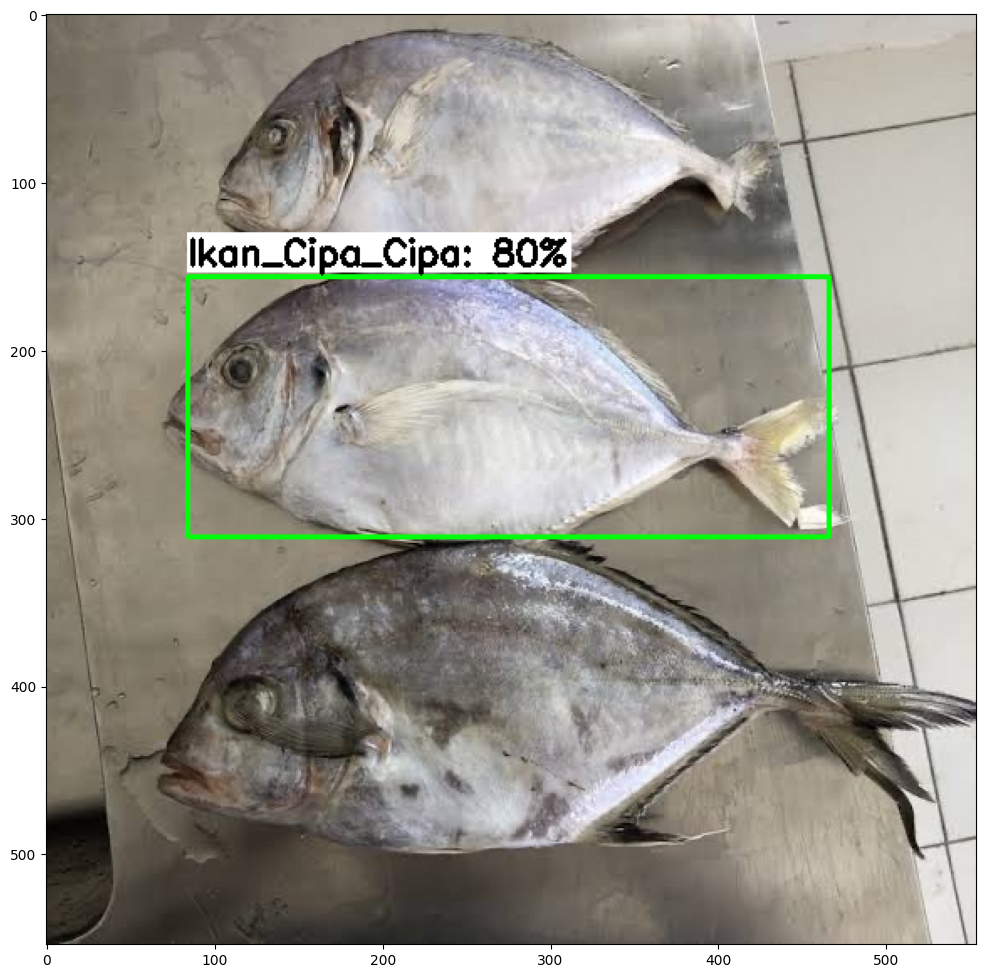

Detected object: Ikan_Kembung, Confidence: 89%


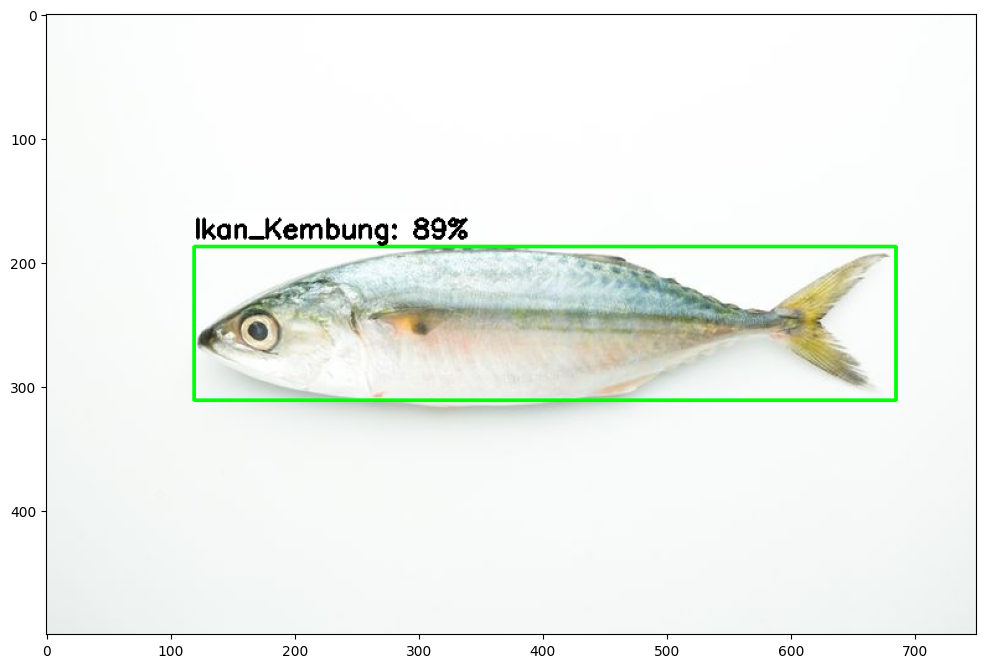

In [31]:
# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'], input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1, (boxes[i][0] * imH)))
              xmin = int(max(1, (boxes[i][1] * imW)))
              ymax = int(min(imH, (boxes[i][2] * imH)))
              xmax = int(min(imW, (boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i] * 100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10), (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              # Print detection results
              print(f'Detected object: {object_name}, Confidence: {int(scores[i] * 100)}%')

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn + '.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath, 'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

# Set up variables for running user's model
PATH_TO_IMAGES = '/content/gambar'  # Path to test images folder
PATH_TO_MODEL = '/content/custom_model_lite/detect.tflite'  # Path to .tflite model file
PATH_TO_LABELS = '/content/labelmap.txt'  # Path to labelmap.txt file
min_conf_threshold = 0.75  # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10  # Number of images to run detection on

# Run function
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)


### 7.2&nbsp;Test .h5 Model

In [ ]:
# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
import tensorflow as tf
from tensorflow.keras.models import load_model

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with Keras model and displaying results

def keras_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

    # Grab filenames of all images in test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Load the label map into memory
    with open(lblpath, 'r') as f:
        labels = [line.strip() for line in f.readlines()]

    # Load the Keras model into memory
    model = load_model(modelpath)

    # Get model input details
    height, width = model.input_shape[1:3]

    # Randomly select test images
    images_to_test = random.sample(images, num_test_images)

    # Loop over every image and perform detection
    for image_path in images_to_test:

        # Load image and resize to expected shape [1xHxWx3]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)

        # Perform the actual detection by running the model with the image as input
        detections = model.predict(input_data)

        # Retrieve detection results
        boxes = detections[1][0]  # Bounding box coordinates of detected objects
        classes = detections[3][0]  # Class index of detected objects
        scores = detections[0][0]  # Confidence of detected objects

        detection_results = []

        # Loop over all detections and draw detection box if confidence is above minimum threshold
        for i in range(len(scores)):
            if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

                # Get bounding box coordinates and draw box
                # Model can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))

                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

                # Draw label
                object_name = labels[int(classes[i])]  # Look up object name from "labels" array using class index
                label = '%s: %d%%' % (object_name, int(scores[i] * 100))  # Example: 'person: 72%'
                labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)  # Get font size
                label_ymin = max(ymin, labelSize[1] + 10)  # Make sure not to draw label too close to top of window
                cv2.rectangle(image, (xmin, label_ymin - labelSize[1] - 10), (xmin + labelSize[0], label_ymin + baseLine - 10), (255, 255, 255), cv2.FILLED)  # Draw white box to put label text in
                cv2.putText(image, label, (xmin, label_ymin - 7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)  # Draw label text

                detection_results.append([object_name, scores[i], xmin, ymin, xmax, ymax])

        # All the results have been drawn on the image, now display the image
        if txt_only == False:  # "text_only" controls whether we want to display the image results or just save them in .txt files
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(12, 16))
            plt.imshow(image)
            plt.show()

        # Save detection results in .txt files (for calculating mAP)
        elif txt_only == True:

            # Get filenames and paths
            image_fn = os.path.basename(image_path)
            base_fn, ext = os.path.splitext(image_fn)
            txt_result_fn = base_fn + '.txt'
            txt_savepath = os.path.join(savepath, txt_result_fn)

            # Write results to text file
            # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
            with open(txt_savepath, 'w') as f:
                for detection in detection_results:
                    f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

    return

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES = '/content/tes1'  # Path to test images folder
PATH_TO_MODEL = '/content/custom_model_h5/detect.h5'  # Path to .h5 model file
PATH_TO_LABELS = '/content/labelmap.txt'  # Path to labelmap.txt file
min_conf_threshold = 0.5  # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10  # Number of images to run detection on

# Run function
keras_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

### 7.2 Calculate mAP
Now we have a visual sense of how our model performs on test images, but how can we quantitatively measure its accuracy?

One popular methord for measuring object detection model accuracy is "mean average precision" (mAP). Basically, the higher the mAP score, the better your model is at detecting objects in images. To learn more about mAP, read through this [article from Roboflow](https://blog.roboflow.com/mean-average-precision/).

We'll use the mAP calculator tool at https://github.com/Cartucho/mAP to determine our model's mAP score. First, we need to clone the repository and remove its existing example data. We'll also download a script I wrote for interfacing with the calculator.

In [ ]:
# Untuk file XML
!mkdir xml
!cd xml

from roboflow import Roboflow
rf = Roboflow(api_key="Y8wjXJqieRjo9ozZYBOw")
project = rf.workspace("bangkit-360xb").project("detection-fish-6asg4")
version = project.version(9)
dataset = version.download("voc")


In [ ]:
%%bash
cd /content
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Next, we'll copy the images and annotation data from the **test** folder to the appropriate folders inside the cloned repository. These will be used as the "ground truth data" that our model's detection results will be compared to.


In [ ]:
!cp /content/models/mymodel/Detection-Fish-9/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

The calculator tool expects annotation data in a format that's different from the Pascal VOC .xml file format we're using. Fortunately, it provides an easy script, `convert_gt_xml.py`, for converting to the expected .txt format.



In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Okay, we've set up the ground truth data, but now we need actual detection results from our model. The detection results will be compared to the ground truth data to calculate the model's accuracy in mAP.

The inference function we defined in Step 7.1 can be used to generate detection data for all the images in the **test** folder. We'll use it the same as before, except this time we'll tell it to save detection results into the `detection-results` folder.

Click Play to run the following code block!

In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/models/mymodel/Detection-Fish-9/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Finally, let's calculate mAP! One popular style for reporting mAP is the COCO metric for mAP @ 0.50:0.95. Basically, this means that mAP is calculated at several IoU thresholds between 0.50 and 0.95, and then the result from each threshold is averaged to get a final mAP score. [Learn more here!](https://blog.roboflow.com/mean-average-precision/)

I wrote a script to run the calculator tool at each IoU threshold, average the results, and report the final accuracy score. It reports mAP for each class and overall mAP. Click Play on the following two blocks to calculate mAP!

In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

The score reported at the end is your model's overall mAP score. Ideally, it should be above 50% (0.50). If it isn't, you can increase your model's accuracy by adding more images to your dataset. See my [dataset video](https://www.youtube.com/watch?v=v0ssiOY6cfg) for tips on how to capture good training images and improve accuracy.

# 8. Download TFLite model

In [18]:
%cd /content
%mkdir ssdmobilenetv2_model

/content


In [19]:
!cp /content/labelmap.txt /content/ssdmobilenetv2_model
!cp /content/dataset/Detection-Fish-14/train/Fish_label_map.pbtxt /content/ssdmobilenetv2_model
!cp /content/models/mymodel/pipeline_file.config /content/ssdmobilenetv2_model
!cp -r /content/custom_model_lite /content/ssdmobilenetv2_model
!cp -r /content/custom_model_h5 /content/ssdmobilenetv2_model

%cd /content
!zip -r ssdmobilenetv2_model.zip ssdmobilenetv2_model

/content
  adding: ssdmobilenetv2_model/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_h5/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_h5/detect.h5 (deflated 92%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/variables/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/variables/variables.index (deflated 78%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/saved_model.pb (deflated 91%)
  adding: ssdmobilenetv2_model/custom_model_h5/saved_model/assets/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_lite/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_lite/detect.tflite (deflated 9%)
  adding: ssdmobilenetv2_model/custom_model_lite/saved_model/ (stored 0%)
  adding: ssdmobilenetv2_model/custom_model_lite/saved_model/variab

In [20]:
from google.colab import files

files.download('/content/ssdmobilenetv2_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 9.&nbsp;(Optional) Post-Training Quantization

Want to make your TFLite model run even faster? Quantize it! Quantizating a model converts its weights from 32-bit floating-point values to 8-bit integer values. This allows the quantized model to run faster and occupy less memory without too much reduction in accuracy.

> Note: If you observe an obvious decrease in detection accuracy when quantizing your model with TF2, I recommend using TensorFlow 1 to quantize your model instead. TF1 supports quantization-aware training, which helps improve the accuracy of quantized models. The ssd-mobilenet-v2-quantized model from the TF1 Model Zoo has fast and accurate performance when trained with a custom dataset. Visit my [TFLite v1 Colab notebook](https://colab.research.google.com/github/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Train_TFLite1_Object_Detection_Model.ipynb) for step-by-step instructions on how to train and quantize a model with TensorFlow 1.

## 9.1. Quantize model
We'll use the "TFLiteConverter" module to perform [post-training quantization](https://www.tensorflow.org/lite/performance/post_training_quantization) on the model. To quantize the model, we need to provide a representative dataset, which is a set of images that represent what the model will see when deployed in the field. First, we'll create a list of images to include in the representative dataset (we'll just use the images in the `train` folder).


In [ ]:
# Get list of all images in train directory
image_path = '/content/images/train'

jpg_file_list = glob.glob(image_path + '/*.jpg')
JPG_file_list = glob.glob(image_path + '/*.JPG')
png_file_list = glob.glob(image_path + '/*.png')
bmp_file_list = glob.glob(image_path + '/*.bmp')

quant_image_list = jpg_file_list + JPG_file_list + png_file_list + bmp_file_list

Next, we'll define a function to yield images from our representative dataset. Refer to [TensorFlow's sample quantization code](https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb#scrollTo=kRDabW_u1wnv) to get a better understanding of what this is doing!

In [ ]:
# A generator that provides a representative dataset
# Code modified from https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb

# First, get input details for model so we know how to preprocess images
interpreter = Interpreter(model_path=PATH_TO_MODEL) # PATH_TO_MODEL is defined in Step 7 above
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
height = input_details[0]['shape'][1]
width = input_details[0]['shape'][2]

import random

def representative_data_gen():
  dataset_list = quant_image_list
  quant_num = 300
  for i in range(quant_num):
    pick_me = random.choice(dataset_list)
    image = tf.io.read_file(pick_me)

    if pick_me.endswith('.jpg') or pick_me.endswith('.JPG'):
      image = tf.io.decode_jpeg(image, channels=3)
    elif pick_me.endswith('.png'):
      image = tf.io.decode_png(image, channels=3)
    elif pick_me.endswith('.bmp'):
      image = tf.io.decode_bmp(image, channels=3)

    image = tf.image.resize(image, [width, height])  # TO DO: Replace 300s with an automatic way of reading network input size
    image = tf.cast(image / 255., tf.float32)
    image = tf.expand_dims(image, 0)
    yield [image]

Finally, we'll initialize the TFLiteConverter module, point it at the TFLite graph we generated in Step 6, and provide it with the representative dataset generator function we created in the previous code block. We'll configure the converter to quantize the model's weight values to INT8 format.

In [ ]:
# Initialize converter module
converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')

# This enables quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
# This sets the representative dataset for quantization
converter.representative_dataset = representative_data_gen
# This ensures that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# For full integer quantization, though supported types defaults to int8 only, we explicitly declare it for clarity.
converter.target_spec.supported_types = [tf.int8]
# These set the input tensors to uint8 and output tensors to float32
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.float32
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect_quant.tflite', 'wb') as f:
  f.write(tflite_model)

## 9.2. Test quantized model
The model has been quantized and exported as `detect_quant.tflite`. Let's test it out! We'll re-use the function from Section 7 for running the model on test images and display the results, except this time we'll point it at the quantized model.

Click Play on the code block below to test the `detect_quant.tflite` model.

In [ ]:
# Set up parameters for inferencing function (using detect_quant.tflite instead of detect.tflite)
PATH_TO_IMAGES='/content/images/test'   #Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect_quant.tflite'   #Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   #Path to labelmap.txt file
min_conf_threshold=0.5   #Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   #Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

If your quantized model isn't performing very well, try using my TensorFlow Lite 1 notebook *(link to be added)* to train a SSD-MobileNet model with your dataset. In my experience, the `ssd-mobilenet-v2-quantized` model from the [TF1 Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md) has the best quantized performance out of any other TensorFlow Lite model.

TFLite models created with TensorFlow 1 are still compatible with the TensorFlow Lite 2 runtime, so your TFLite 1 model will still work with my [TensorFlow setup guide for the Raspberry Pi](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Raspberry_Pi_Guide.md).

## 9.3 Calculate quantized model mAP

Let's calculate the quantize model's mAP using the calculator tool we set up in Step 7.2. We just need to perform inference with our quantized model (`detect_quant.tflite`) to get a new set of detection results.

Run the following block to run inference on the test images and save the detection results.

In [ ]:
# Need to remove existing detection results first
!rm /content/mAP/input/detection-results/*

# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect_quant.tflite'   # Path to quantized .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Now we can run the mAP calculation script to determine our quantized model's mAP.

In [ ]:
cd /content/mAP

In [ ]:
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

## 9.4. Compile model for Edge TPU

Now that the model has been converted to TFLite and quantized, we can compile it to run on Edge TPU devices like the [Coral USB Accelerator](https://coral.ai/products/accelerator/) or the [Coral Dev Board](https://coral.ai/products/dev-board/). This allows the model to run much faster! For information on how to set up the USB Accelerator, my [TensorFlow Lite repository on GitHub](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/deploy_guides/Raspberry_Pi_Guide.md#section-2---run-edge-tpu-object-detection-models-on-the-raspberry-pi-using-the-coral-usb-accelerator).

First, install the Edge TPU Compiler package inside this Colab instance.

In [ ]:
! curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -
! echo "deb https://packages.cloud.google.com/apt coral-edgetpu-stable main" | sudo tee /etc/apt/sources.list.d/coral-edgetpu.list
! sudo apt-get update
! sudo apt-get install edgetpu-compiler

Next, compile the quantize TFLite model. (If your model has a different filename than "detect_quant.tflite", use that instead.)

In [ ]:
%cd /content/custom_model_lite
!edgetpu_compiler detect_quant.tflite
!mv detect_quant_edgetpu.tflite edgetpu.tflite
!rm detect_quant_edgetpu.log

The compiled model will be output in the `custom_model_lite` folder as "detect__quant_edgetpu.tflite". It gets renamed to "edgetpu.tflite" to be consistent with my code. Zip the `custom_model_lite` folder and download it by running the two code blocks below.

In [ ]:
%cd /content
!zip -r custom_model_lite.zip custom_model_lite

In [ ]:
from google.colab import files

files.download('custom_model_lite.zip')

Now you're all set to use the Coral model! For instructions on how to run an object detection model on the Raspberry Pi using the Coral USB Acclerator, please see my video, ["How to Use the Coral USB Accelerator with the Raspberry Pi"](https://www.youtube.com/watch?v=qJMwNHQNOVU).